## Importing Libraries

In [129]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

## Reading Datasets

In [108]:
df1 = pd.read_csv(r"C:\Users\Riya\OneDrive\Desktop\Data Science Project\prevalence-by-mental-and-substance-use-disorder.csv")
df2 = pd.read_csv(r"C:\Users\Riya\OneDrive\Desktop\Data Science Project\daly.csv")

In [109]:
df1.head()

,Entity,Code,Year,Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent),Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent),Prevalence - Eating disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Anxiety disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Drug use disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Depressive disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Alcohol use disorders - Sex: Both - Age: Age-standardized (Percent)
0,Afghanistan,AFG,1990,0.228979,0.721207,0.131001,4.835127,0.454202,5.125291,0.444036
1,Afghanistan,AFG,1991,0.228120,0.719952,0.126395,4.821765,0.447112,5.116306,0.444250
2,Afghanistan,AFG,1992,0.227328,0.718418,0.121832,4.801434,0.441190,5.106558,0.445501
3,Afghanistan,AFG,1993,0.226468,0.717452,0.117942,4.789363,0.435581,5.100328,0.445958
4,Afghanistan,AFG,1994,0.225567,0.717012,0.114547,4.784923,0.431822,5.099424,0.445779


In [110]:
df2.head()

,Entity,Code,Year,DALYs - Disability Adjusted Life Years - Mental disorders - Sex: Both - Age: All Ages (Percent)
0,Afghanistan,AFG,1990,1.696670
1,Afghanistan,AFG,1991,1.734281
2,Afghanistan,AFG,1992,1.791189
3,Afghanistan,AFG,1993,1.776779
4,Afghanistan,AFG,1994,1.712986


In [111]:
#merging two datsets
df = pd.merge(df1, df2)

In [112]:
df

,Entity,Code,Year,Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent),Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent),Prevalence - Eating disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Anxiety disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Drug use disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Depressive disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Alcohol use disorders - Sex: Both - Age: Age-standardized (Percent),DALYs - Disability Adjusted Life Years - Mental disorders - Sex: Both - Age: All Ages (Percent)
0,Afghanistan,AFG,1990,0.228979,0.721207,0.131001,4.835127,0.454202,5.125291,0.444036,1.696670
1,Afghanistan,AFG,1991,0.228120,0.719952,0.126395,4.821765,0.447112,5.116306,0.444250,1.734281
2,Afghanistan,AFG,1992,0.227328,0.718418,0.121832,4.801434,0.441190,5.106558,0.445501,1.791189
3,Afghanistan,AFG,1993,0.226468,0.717452,0.117942,4.789363,0.435581,5.100328,0.445958,1.776779
4,Afghanistan,AFG,1994,0.225567,0.717012,0.114547,4.784923,0.431822,5.099424,0.445779,1.712986
...,...,...,...,...,...,...,...,...,...,...,...
6835,Zimbabwe,ZWE,2015,0.209359,0.560882,0.099610,3.315701,0.599604,3.548613,1.734969,2.193166
6836,Zimbabwe,ZWE,2016,0.209979,0.561768,0.100821,3.324230,0.603658,3.557508,1.689281,2.279813
6837,Zimbabwe,ZWE,2017,0.210631,0.562612,0.101671,3.330569,0.608096,3.564138,1.651805,2.364265
6838,Zimbabwe,ZWE,2018,0.211237,0.563283,0.102398,3.317500,0.609065,3.563141,1.686711,2.472949


## Data Cleaning

In [113]:
#display all details of data
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6840 entries, 0 to 6839
Data columns (total 11 columns):
 #   Column                                                                                           Non-Null Count  Dtype  
---  ------                                                                                           --------------  -----  
 0   Entity                                                                                           6840 non-null   object 
 1   Code                                                                                             6150 non-null   object 
 2   Year                                                                                             6840 non-null   int64  
 3   Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent)                         6840 non-null   float64
 4   Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent)                      6840 non-null   float64
 5   Preval

In [114]:
#total null values in dataset
df.isnull().sum()

Entity                                                                                               0
Code                                                                                               690
Year                                                                                                 0
Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent)                             0
Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent)                          0
Prevalence - Eating disorders - Sex: Both - Age: Age-standardized (Percent)                          0
Prevalence - Anxiety disorders - Sex: Both - Age: Age-standardized (Percent)                         0
Prevalence - Drug use disorders - Sex: Both - Age: Age-standardized (Percent)                        0
Prevalence - Depressive disorders - Sex: Both - Age: Age-standardized (Percent)                      0
Prevalence - Alcohol use disorders - Sex: Both - Age: Age-standardized (P

In [115]:
#drop the "Code" column
df.drop(columns = ["Code"], inplace = True)

In [116]:
#size of dataset
df.size

68400

In [117]:
#total rows and column of dataset
df.shape

(6840, 10)

In [118]:
#adding underscore between column names
l = []
col = df.columns.to_list()
for i in col:
    k = i.split("-")
    if len(k) == 1:
        r = str(k)[2:-2]
        l.append(r)
    else:
        m = k[1]
        j = "_".join(m.split())
        l.append(j)
l

['Entity',
 'Year',
 'Schizophrenia',
 'Bipolar_disorder',
 'Eating_disorders',
 'Anxiety_disorders',
 'Drug_use_disorders',
 'Depressive_disorders',
 'Alcohol_use_disorders',
 'Disability_Adjusted_Life_Years']

In [119]:
df.columns = l

In [125]:
df

,Entity,Year,Schizophrenia,Bipolar_disorder,Eating_disorders,Anxiety_disorders,Drug_use_disorders,Depressive_disorders,Alcohol_use_disorders,Disability_Adjusted_Life_Years
0,Afghanistan,1990,0.228979,0.721207,0.131001,4.835127,0.454202,5.125291,0.444036,1.696670
1,Afghanistan,1991,0.228120,0.719952,0.126395,4.821765,0.447112,5.116306,0.444250,1.734281
2,Afghanistan,1992,0.227328,0.718418,0.121832,4.801434,0.441190,5.106558,0.445501,1.791189
3,Afghanistan,1993,0.226468,0.717452,0.117942,4.789363,0.435581,5.100328,0.445958,1.776779
4,Afghanistan,1994,0.225567,0.717012,0.114547,4.784923,0.431822,5.099424,0.445779,1.712986
...,...,...,...,...,...,...,...,...,...,...
6835,Zimbabwe,2015,0.209359,0.560882,0.099610,3.315701,0.599604,3.548613,1.734969,2.193166
6836,Zimbabwe,2016,0.209979,0.561768,0.100821,3.324230,0.603658,3.557508,1.689281,2.279813
6837,Zimbabwe,2017,0.210631,0.562612,0.101671,3.330569,0.608096,3.564138,1.651805,2.364265
6838,Zimbabwe,2018,0.211237,0.563283,0.102398,3.317500,0.609065,3.563141,1.686711,2.472949


## Numerical Analysis

In [123]:
df.dtypes[df.dtypes != "object"].index

Index(['Year', 'Schizophrenia', 'Bipolar_disorder', 'Eating_disorders',
       'Anxiety_disorders', 'Drug_use_disorders', 'Depressive_disorders',
       'Alcohol_use_disorders', 'Disability_Adjusted_Life_Years'],
      dtype='object')

In [87]:
def numerical_analysis(data, col):
    missing = data[col].isnull().sum()
    min_val = round(data[col].min(), 2)
    max_val = round(data[col].max(), 2)
    mean = round(data[col].mean(), 2)
    var = round(data[col].var(), 2)
    std = round(data[col].std(), 2)
    range_val = round(max_val - min_val, 2)
    q1 = round(data[col].quantile(.25), 2)
    q2 = round(data[col].quantile(.5), 2)
    q3 = round(data[col].quantile(.75), 2)
    skew = round(data[col].skew(), 2)
    kurt = round(data[col].kurt(), 2)
    my_val = {"missing" : missing, "min" : min_val, "max" : max_val, "mean" : mean,
             "var" : var,"std" : std, "range" : range_val,"q1" : q1, "q2" : q2,"q3" : q3,
            "skewness" : skew, "kurtosis" : kurt}
    sns.histplot(data[col])
    plt.show()
    sns.boxplot(data = data, y = data[col])
    plt.show()
    return my_val

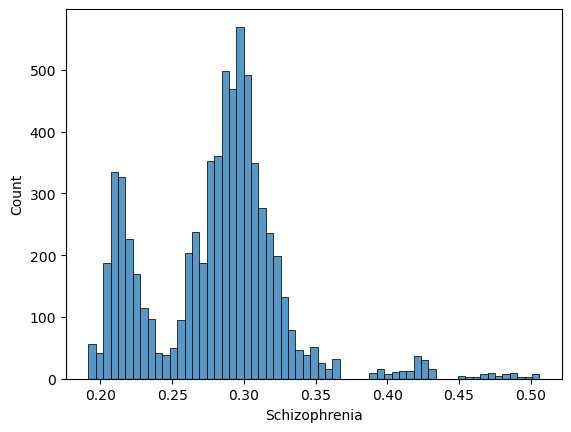

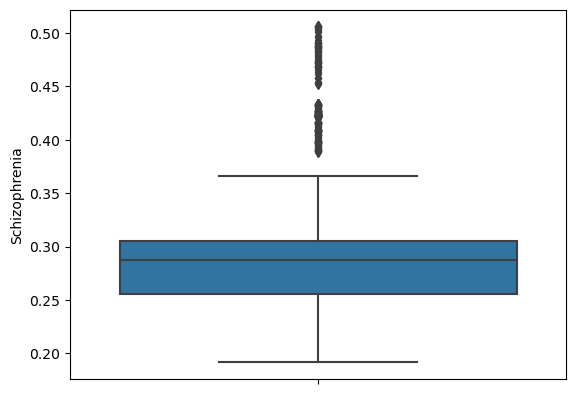

{'missing': 0,
 'min': 0.19,
 'max': 0.51,
 'mean': 0.28,
 'var': 0.0,
 'std': 0.05,
 'range': 0.32,
 'q1': 0.26,
 'q2': 0.29,
 'q3': 0.3,
 'skewness': 0.71,
 'kurtosis': 2.44}

In [88]:
numerical_analysis(data = df, col = "Schizophrenia")

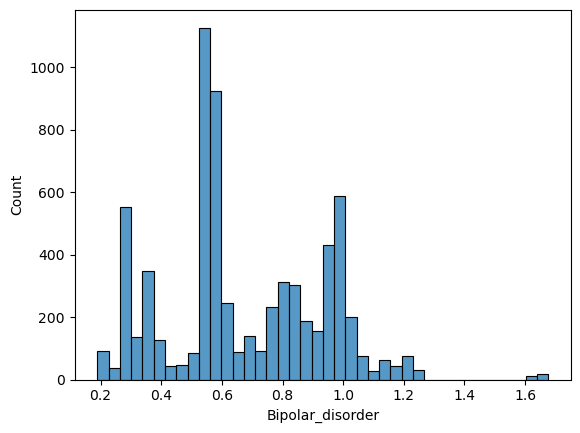

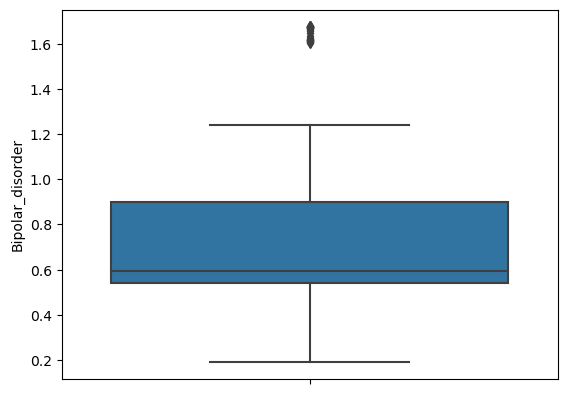

{'missing': 0,
 'min': 0.19,
 'max': 1.68,
 'mean': 0.67,
 'var': 0.07,
 'std': 0.26,
 'range': 1.49,
 'q1': 0.54,
 'q2': 0.59,
 'q3': 0.9,
 'skewness': 0.3,
 'kurtosis': -0.28}

In [89]:
numerical_analysis(data = df, col = "Bipolar_disorder")

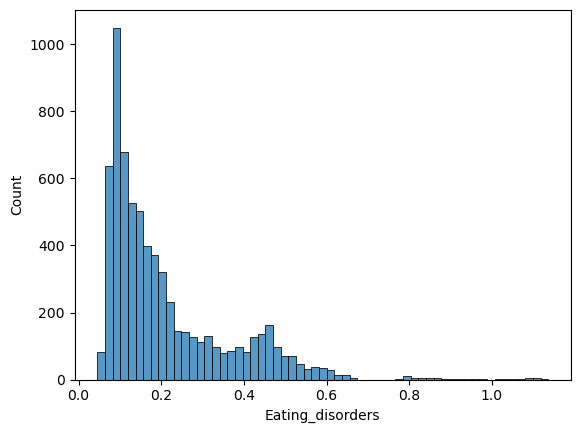

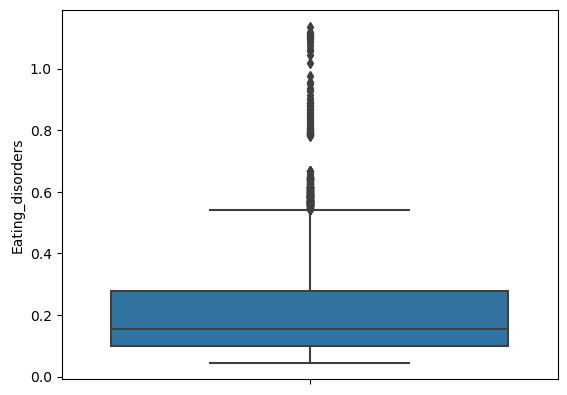

{'missing': 0,
 'min': 0.05,
 'max': 1.14,
 'mean': 0.21,
 'var': 0.02,
 'std': 0.15,
 'range': 1.09,
 'q1': 0.1,
 'q2': 0.15,
 'q3': 0.28,
 'skewness': 1.71,
 'kurtosis': 3.76}

In [90]:
numerical_analysis(data = df, col = "Eating_disorders")

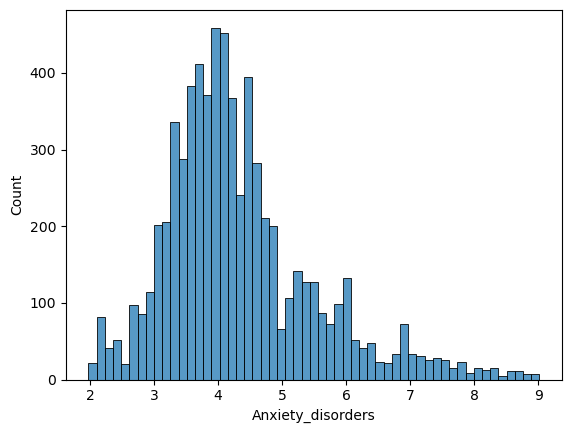

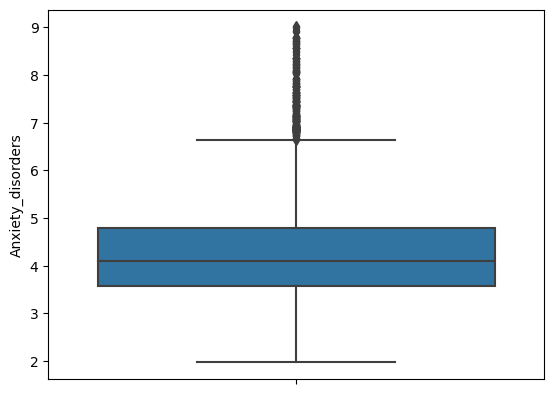

{'missing': 0,
 'min': 1.97,
 'max': 9.02,
 'mean': 4.33,
 'var': 1.39,
 'std': 1.18,
 'range': 7.05,
 'q1': 3.57,
 'q2': 4.09,
 'q3': 4.8,
 'skewness': 1.08,
 'kurtosis': 1.51}

In [91]:
numerical_analysis(data = df, col = "Anxiety_disorders")

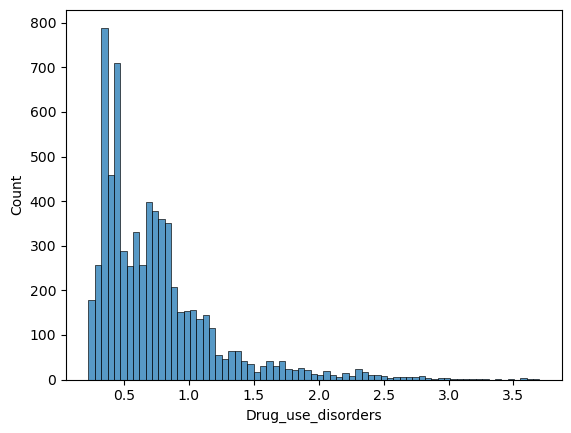

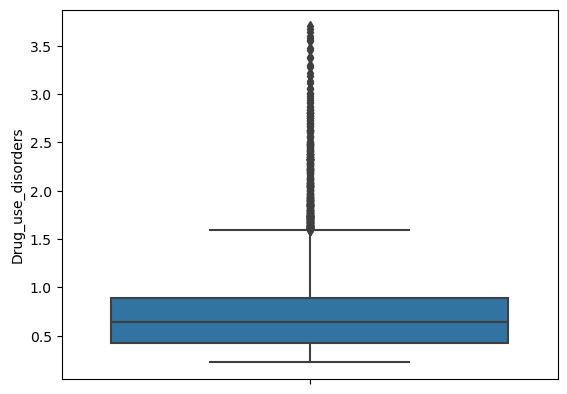

{'missing': 0,
 'min': 0.23,
 'max': 3.7,
 'mean': 0.75,
 'var': 0.21,
 'std': 0.46,
 'range': 3.47,
 'q1': 0.42,
 'q2': 0.65,
 'q3': 0.89,
 'skewness': 2.08,
 'kurtosis': 5.94}

In [92]:
numerical_analysis(data = df, col = "Drug_use_disorders")

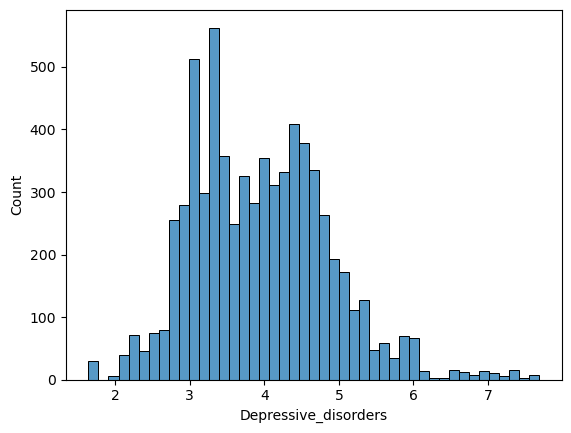

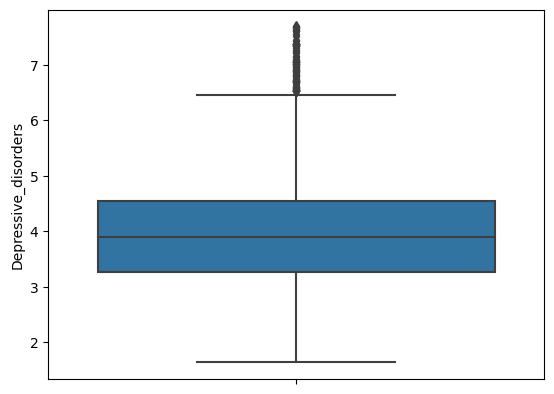

{'missing': 0,
 'min': 1.64,
 'max': 7.69,
 'mean': 3.95,
 'var': 0.85,
 'std': 0.92,
 'range': 6.05,
 'q1': 3.26,
 'q2': 3.9,
 'q3': 4.55,
 'skewness': 0.56,
 'kurtosis': 0.59}

In [93]:
numerical_analysis(data = df, col = "Depressive_disorders")

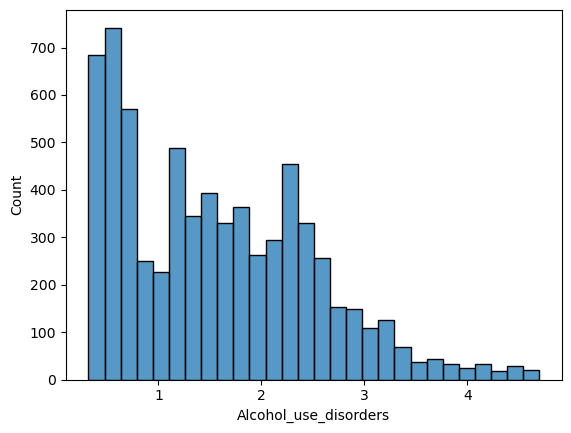

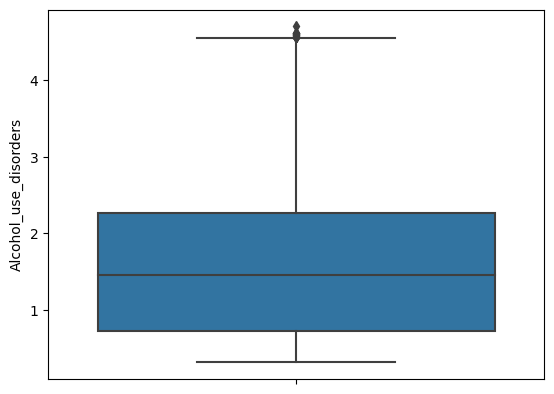

{'missing': 0,
 'min': 0.32,
 'max': 4.7,
 'mean': 1.58,
 'var': 0.87,
 'std': 0.93,
 'range': 4.38,
 'q1': 0.73,
 'q2': 1.46,
 'q3': 2.26,
 'skewness': 0.67,
 'kurtosis': -0.11}

In [94]:
numerical_analysis(data = df, col = "Alcohol_use_disorders")

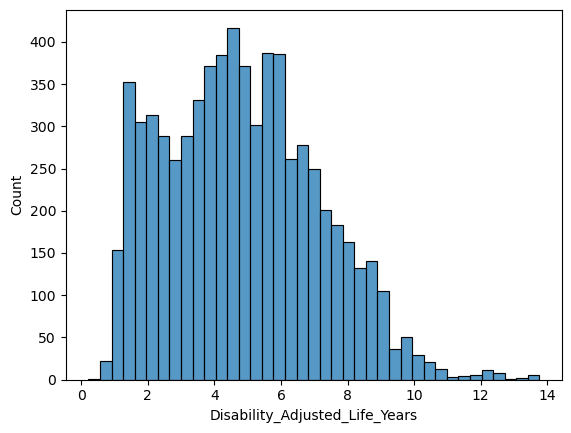

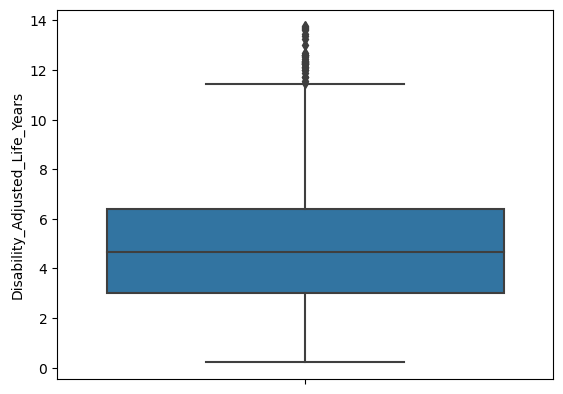

{'missing': 0,
 'min': 0.22,
 'max': 13.76,
 'mean': 4.82,
 'var': 5.26,
 'std': 2.29,
 'range': 13.54,
 'q1': 3.01,
 'q2': 4.68,
 'q3': 6.39,
 'skewness': 0.4,
 'kurtosis': -0.25}

In [95]:
numerical_analysis(data = df, col = "Disability_Adjusted_Life_Years")

## Outlier Treatment 

In [96]:
def outlier_treatment(col):
    q1 = df[col].quantile(.25)
    q3 = df[col].quantile(.75)
    lower_cap = q1 - 1.5 * (q3 - q1)
    upper_cap = q3 + 1.5 * (q3 - q1)

    df[col] = np.where(df[col] >= upper_cap, upper_cap, df[col])
    df[col] = np.where(df[col] <= lower_cap, lower_cap, df[col])

In [97]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6840 entries, 0 to 6839
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Entity                          6840 non-null   object        
 1   Year                            6840 non-null   datetime64[ns]
 2   Schizophrenia                   6840 non-null   float64       
 3   Bipolar_disorder                6840 non-null   float64       
 4   Eating_disorders                6840 non-null   float64       
 5   Anxiety_disorders               6840 non-null   float64       
 6   Drug_use_disorders              6840 non-null   float64       
 7   Depressive_disorders            6840 non-null   float64       
 8   Alcohol_use_disorders           6840 non-null   float64       
 9   Disability_Adjusted_Life_Years  6840 non-null   float64       
dtypes: datetime64[ns](1), float64(8), object(1)
memory usage: 587.8+ KB


<Axes: ylabel='Schizophrenia'>

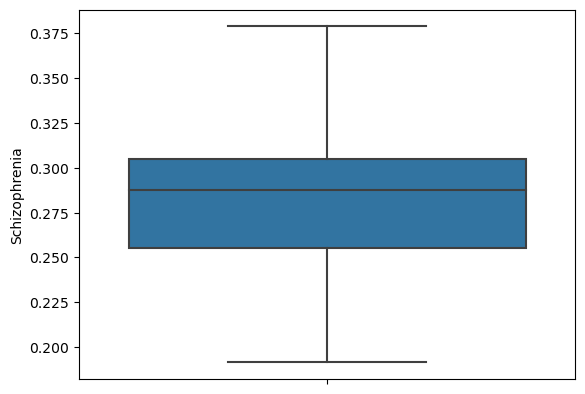

In [99]:
outlier_treatment(col = "Schizophrenia")
sns.boxplot(data = df, y = "Schizophrenia")

<Axes: ylabel='Bipolar_disorder'>

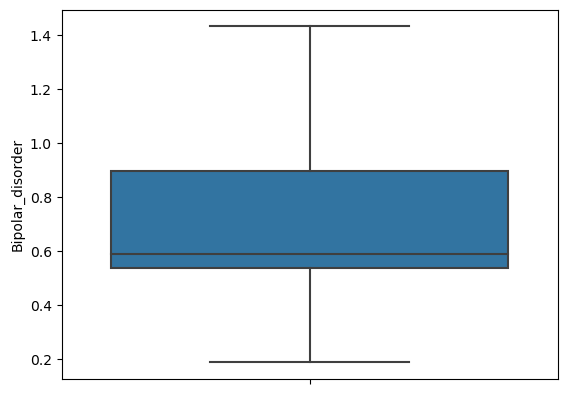

In [100]:
outlier_treatment(col = "Bipolar_disorder")
sns.boxplot(data = df, y = "Bipolar_disorder")

<Axes: ylabel='Eating_disorders'>

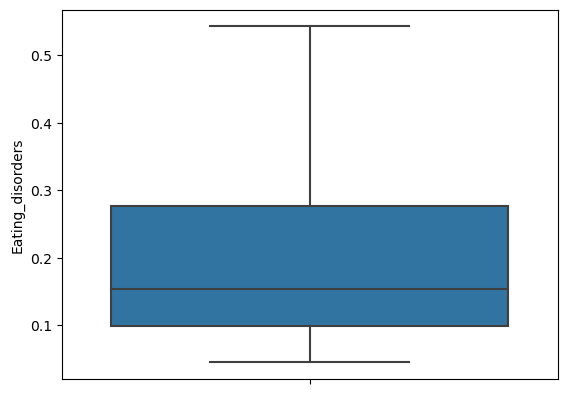

In [101]:
outlier_treatment(col = "Eating_disorders")
sns.boxplot(data = df, y = "Eating_disorders")

<Axes: ylabel='Anxiety_disorders'>

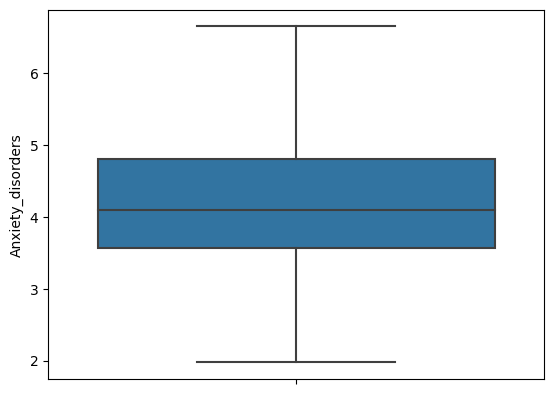

In [102]:
outlier_treatment(col = "Anxiety_disorders")
sns.boxplot(data = df, y = "Anxiety_disorders")

<Axes: ylabel='Drug_use_disorders'>

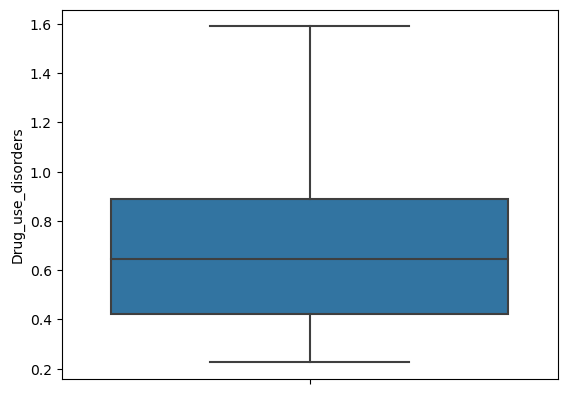

In [103]:
outlier_treatment(col = "Drug_use_disorders")
sns.boxplot(data = df, y = "Drug_use_disorders")

<Axes: ylabel='Depressive_disorders'>

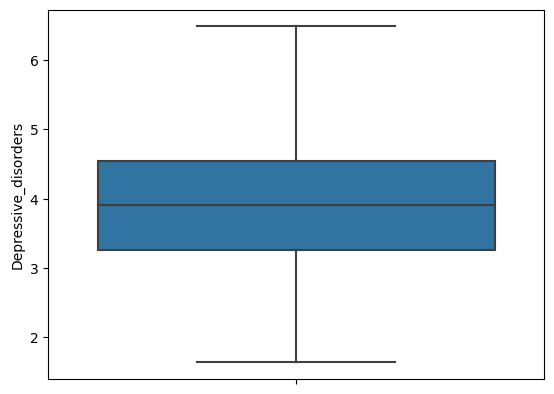

In [104]:
outlier_treatment(col = "Depressive_disorders")
sns.boxplot(data = df, y = "Depressive_disorders")

<Axes: ylabel='Alcohol_use_disorders'>

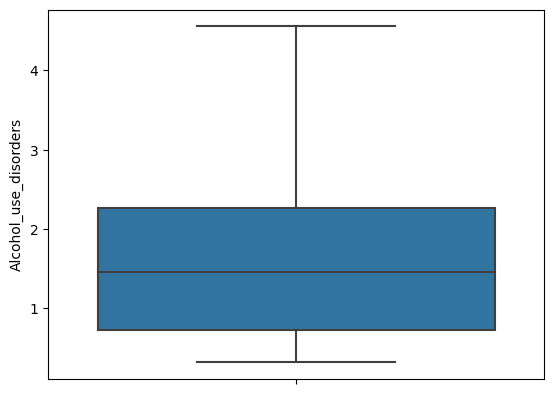

In [105]:
outlier_treatment(col = "Alcohol_use_disorders")
sns.boxplot(data = df, y = "Alcohol_use_disorders")

<Axes: ylabel='Disability_Adjusted_Life_Years'>

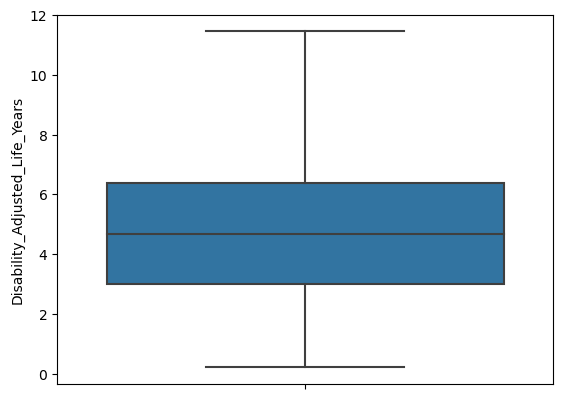

In [106]:
outlier_treatment(col = "Disability_Adjusted_Life_Years")
sns.boxplot(data = df, y = "Disability_Adjusted_Life_Years")

## Data Visualisation 

### 1. Prevalance of disorders by entity

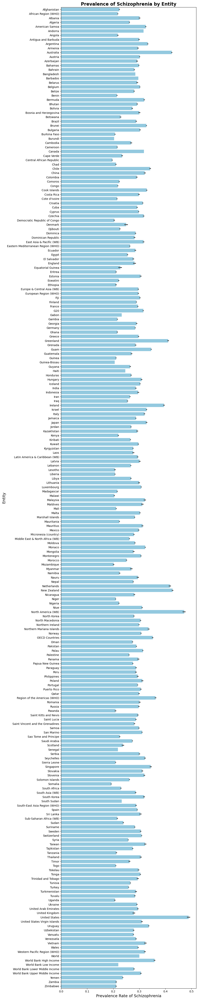

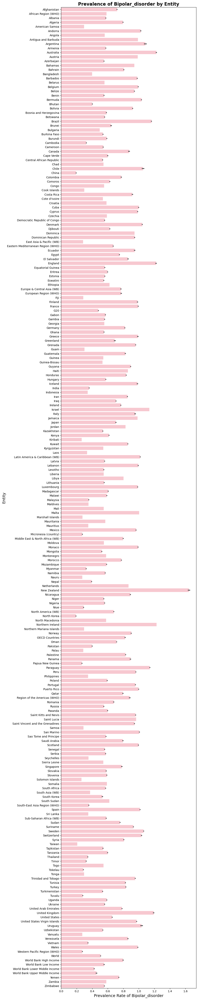

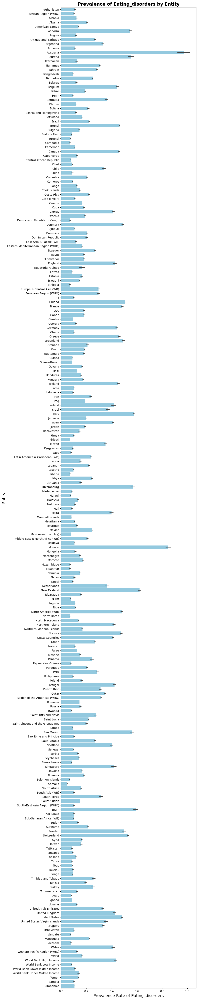

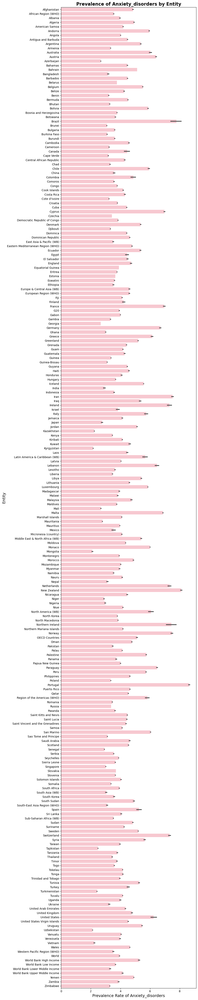

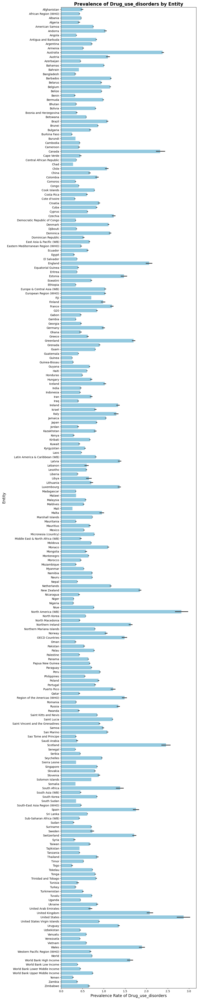

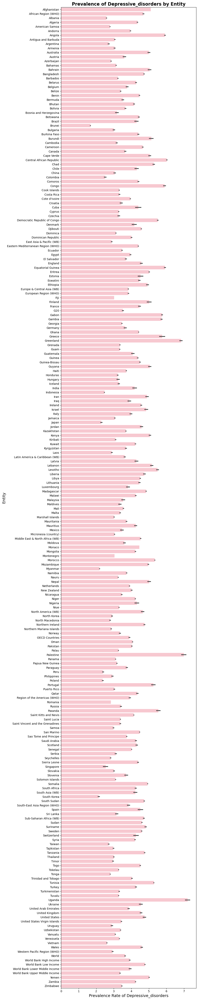

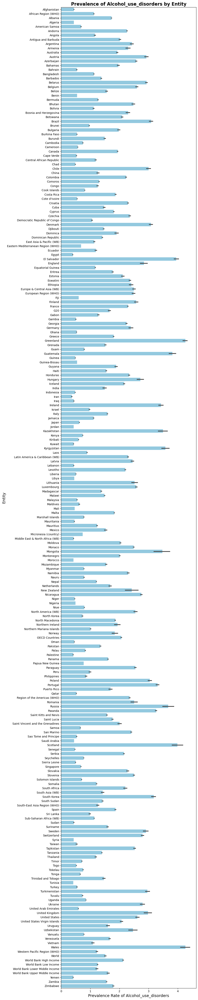

In [14]:
for i in range(0, len(df.columns[2:9])):
    plt.figure(figsize = (10, 50))
    if i % 2 == 0:
        sns.barplot(x=df.columns[i+2], y="Entity", data=df, color='skyblue')
    else:
        sns.barplot(x=df.columns[i+2], y="Entity", data=df, color='pink')
    plt.xlabel(f"Prevalence Rate of {df.columns[i+2]}", fontsize=14)
    plt.ylabel('Entity', fontsize=14)
    plt.title(f"Prevalence of {df.columns[i+2]} by Entity", fontsize=16, fontweight='bold')
    plt.xticks(fontsize=10)  
    plt.yticks(fontsize=10)  
    plt.tight_layout()
    plt.show()

### 2. Prevalence of disorders and DALY over the years 

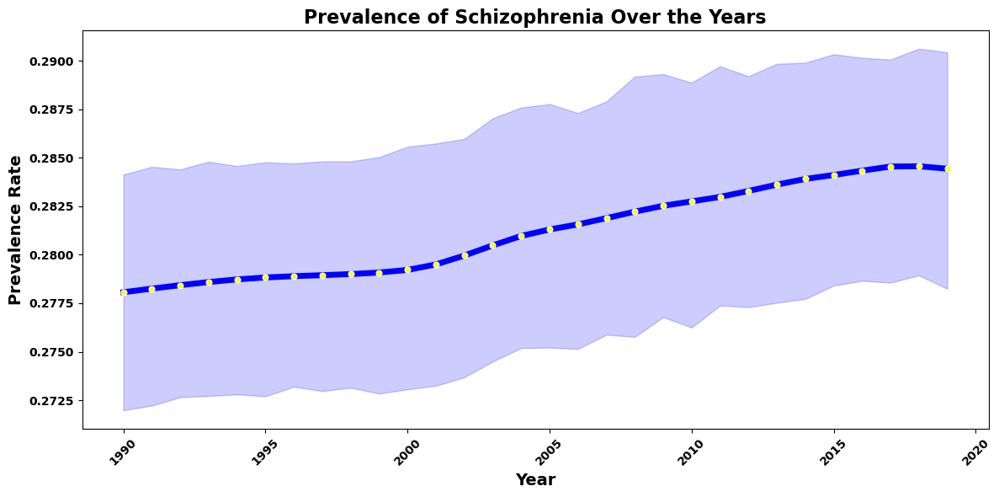

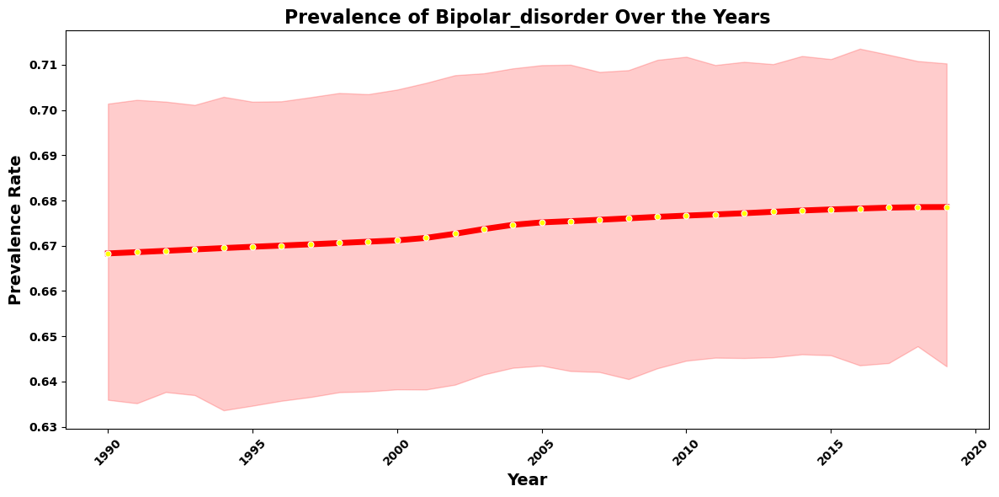

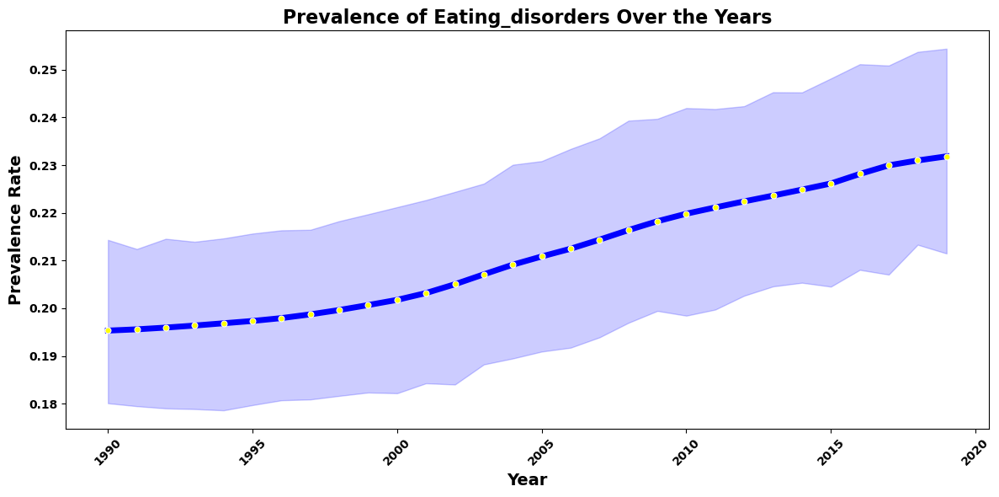

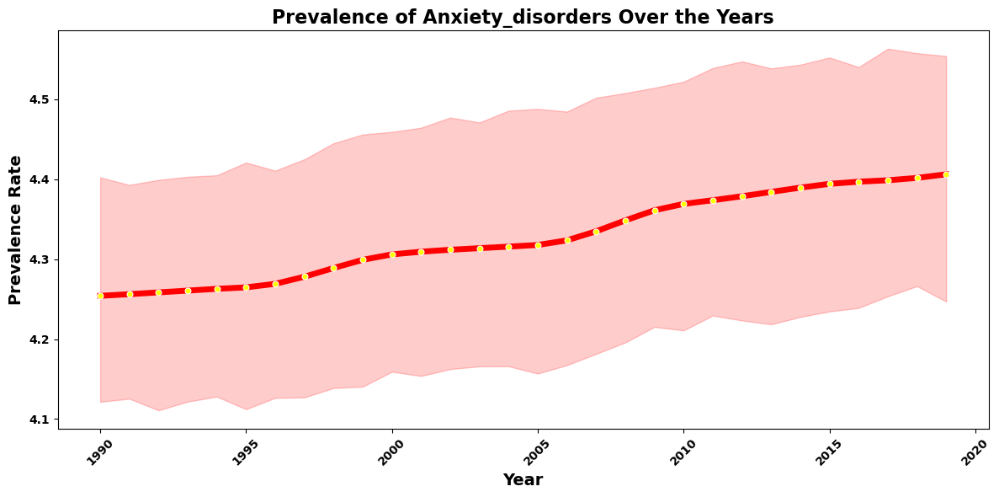

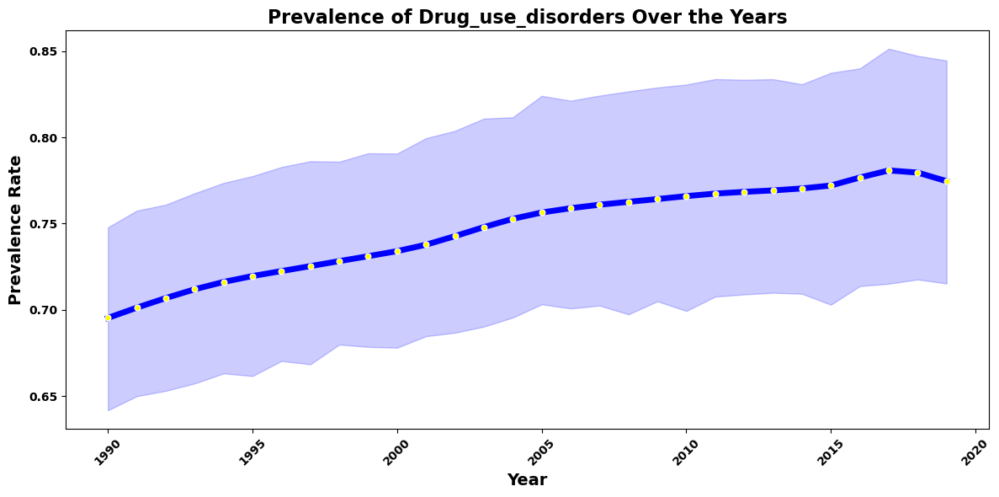

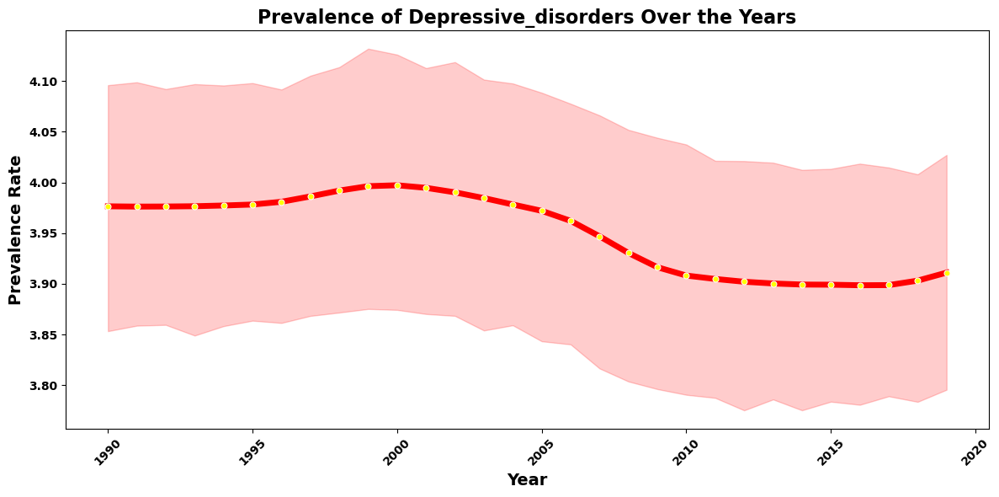

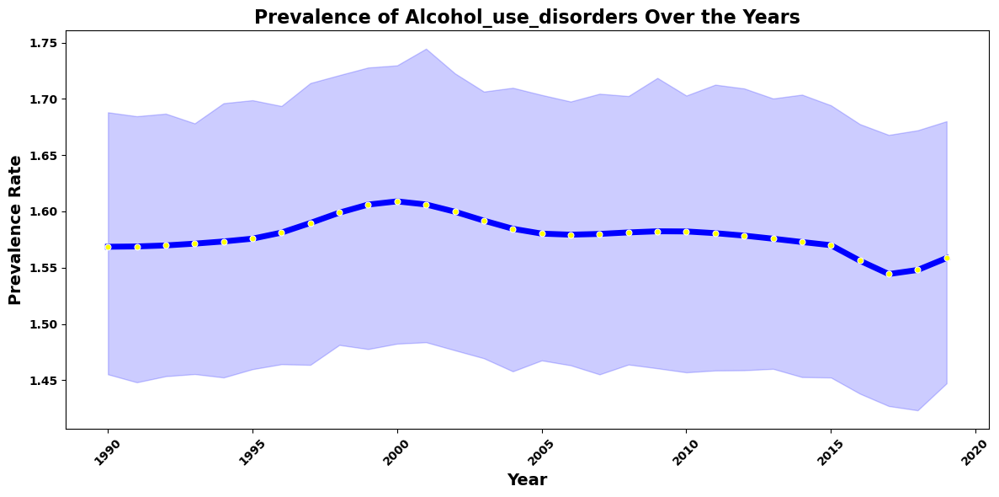

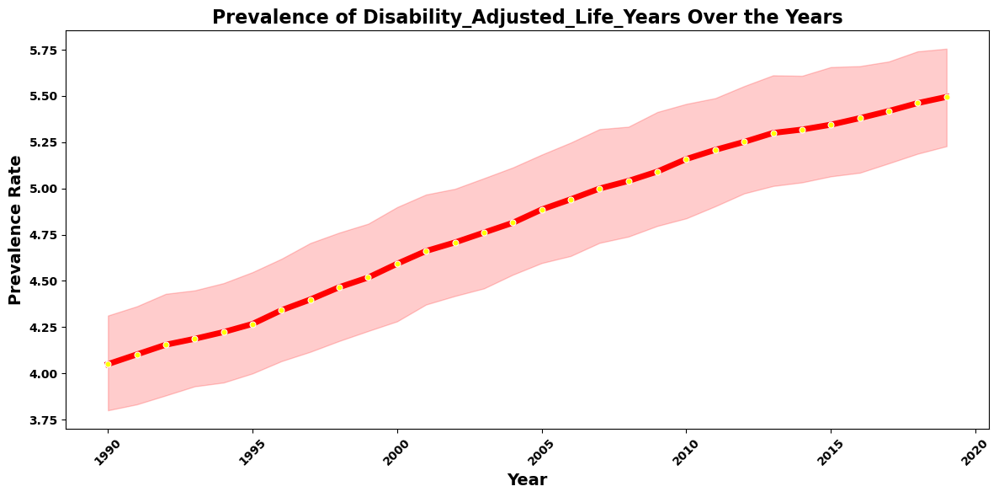

In [15]:
for i in range(0, len(df.columns[2:])):
    plt.figure(figsize=(12, 6))
    if i % 2 == 0:
        sns.lineplot(data=df, x='Year', y=df.columns[i+2], linewidth = "5", marker='o', markersize=5, markerfacecolor = "yellow", color='b')

    else:
        sns.lineplot(data=df, x='Year', y=df.columns[i+2], linewidth = "5", marker='o', markersize=5, markerfacecolor = "yellow", color='r')

    plt.title(f"Prevalence of {df.columns[i+2]} Over the Years", fontsize=16, fontweight='bold')
    plt.xlabel('Year', fontsize=14, fontweight='bold')
    plt.ylabel('Prevalence Rate', fontsize=14, fontweight='bold')

    plt.xticks(fontsize=10, fontweight='bold', rotation=45)  
    plt.yticks(fontsize=10, fontweight='bold')  
    plt.tight_layout()  
    plt.show()

### 3. Distribution of  Prevalence Rates for disorders

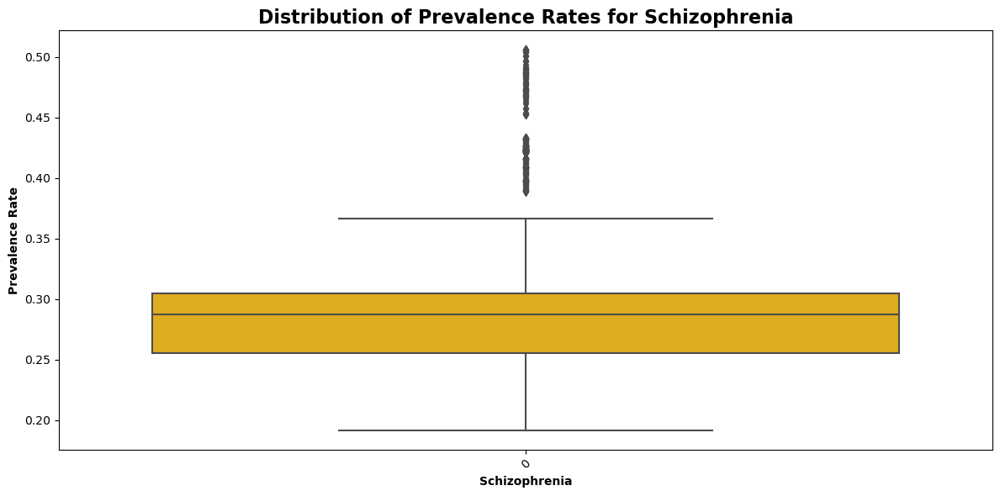

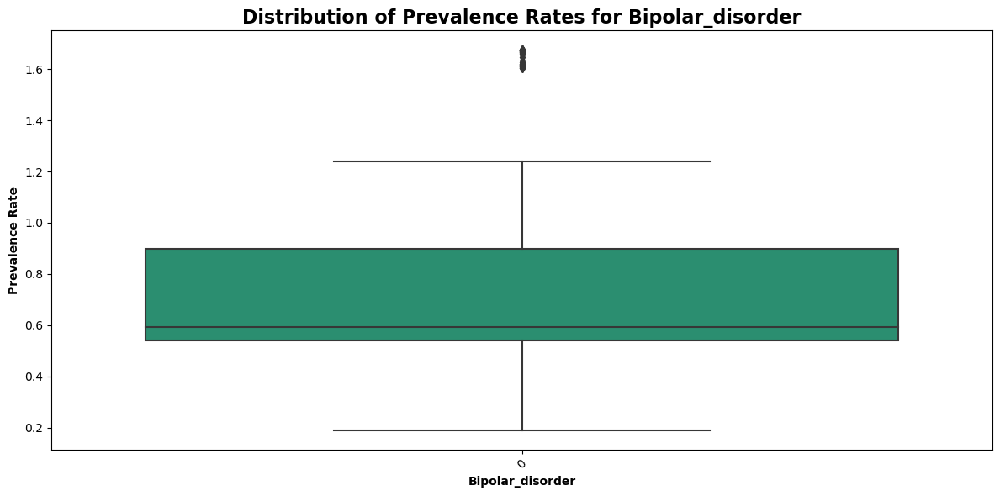

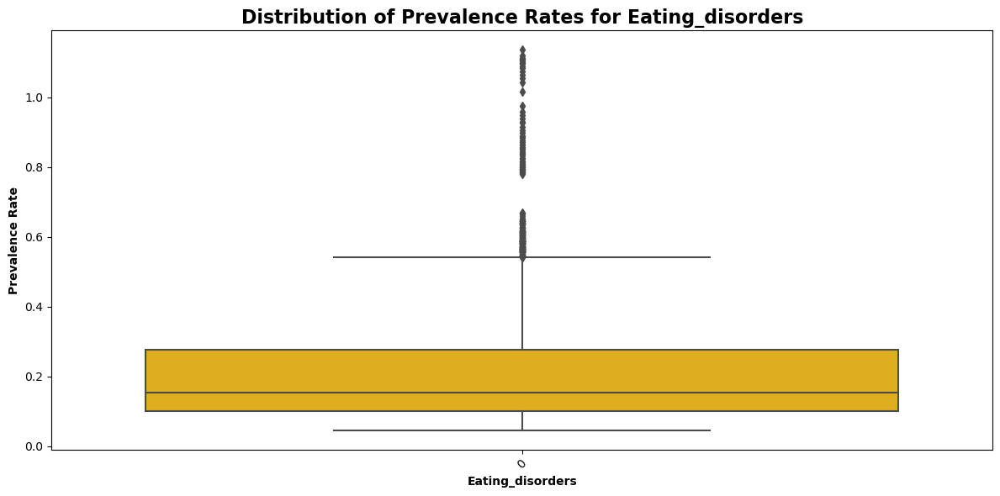

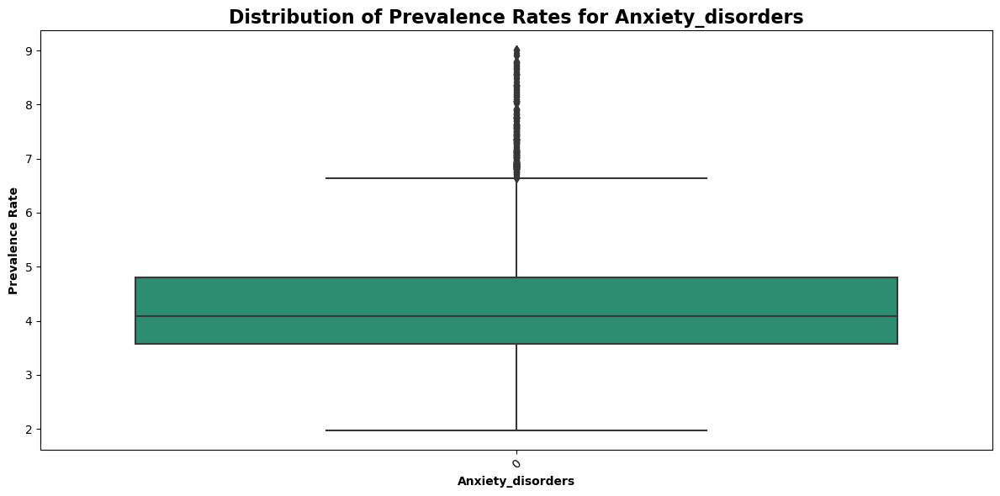

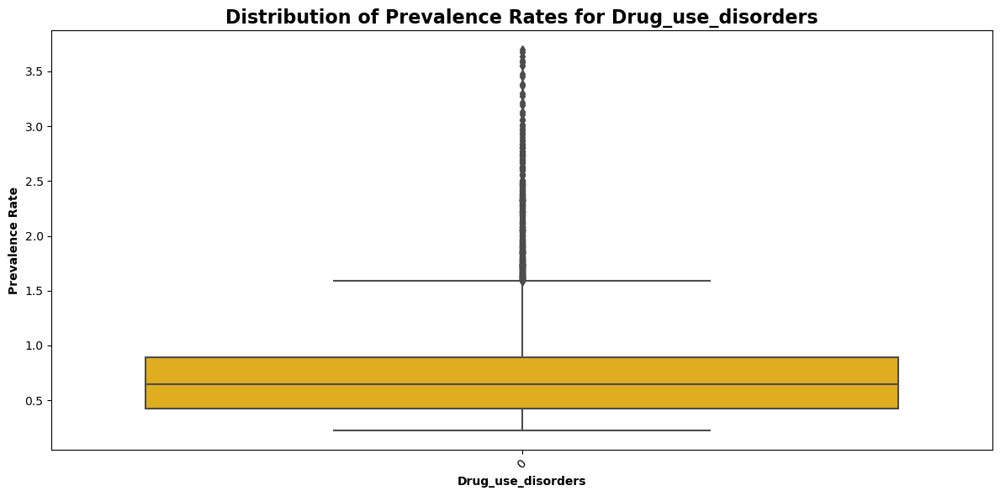

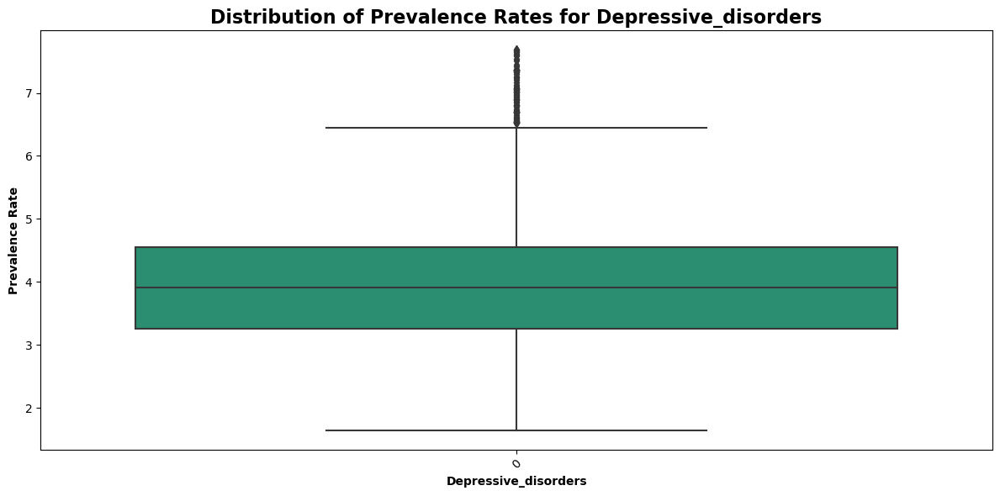

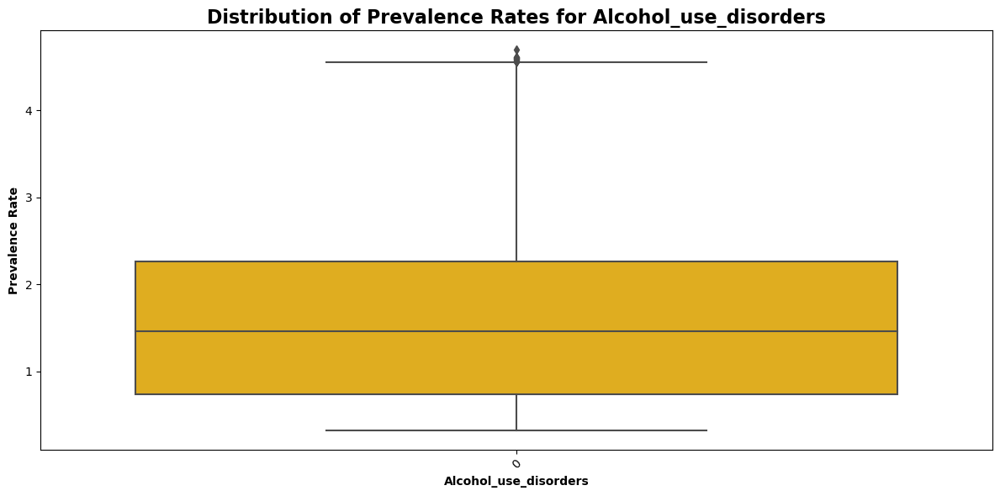

In [16]:
for i in range(0, len(df.columns[2:9])):
    plt.figure(figsize=(12, 6))
    if i % 2 == 0:
        sns.boxplot(data=df[df.columns[i+2]], orient='v', palette="Wistia")
    else:
        sns.boxplot(data=df[df.columns[i+2]], orient='v', palette="Dark2")
    plt.xticks(rotation=45)
    plt.title(f"Distribution of Prevalence Rates for {df.columns[i+2]}",  fontsize=16, fontweight='bold')
    plt.xlabel(f"{df.columns[i+2]}", fontsize=10, fontweight='bold')
    plt.ylabel('Prevalence Rate', fontsize=10, fontweight='bold')
    plt.tight_layout()
    plt.show()

### 4. Distribution of Mental Health Disorders in India in 1990 and 2019

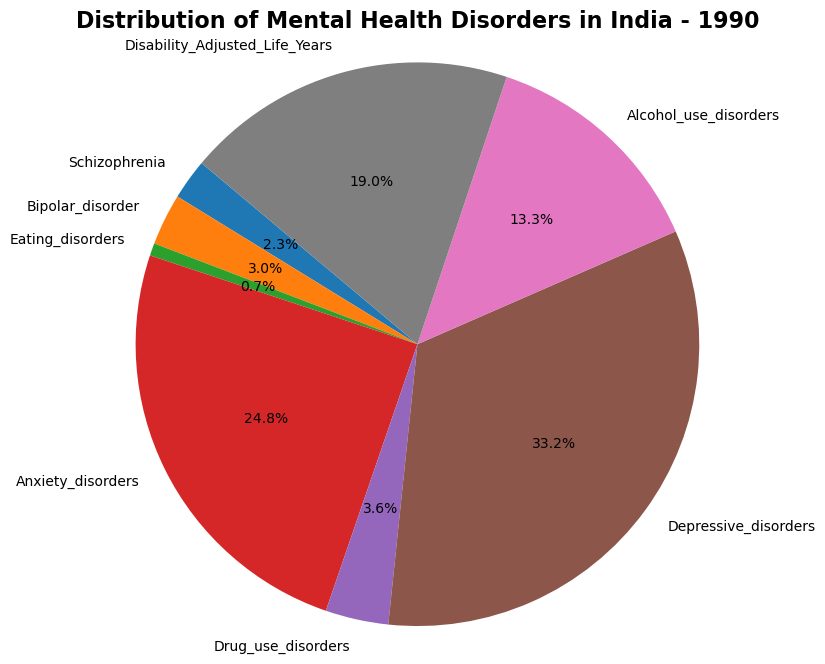

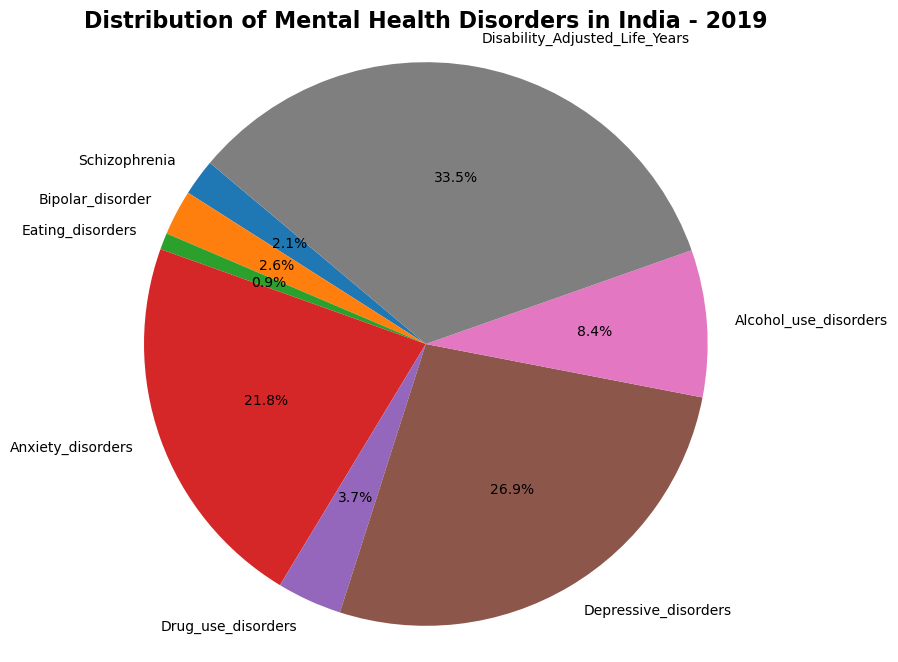

In [17]:
year = [1990, 2019]
for i in year:
    data_for_entity_year = df[(df['Entity'] == "India") & (df['Year'] == i)]
    col = df.columns[2:]

    # Get the prevalence rates for each disorder
    prevalence_rates = data_for_entity_year[col].values[0]
    plt.figure(figsize=(8, 8))
    plt.pie(prevalence_rates, labels=col, autopct='%1.1f%%', startangle=140)
    plt.title(f'Distribution of Mental Health Disorders in India - {i}', fontsize=16, fontweight='bold')

    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

    plt.show()

### 5. Correlation between Prevalence Rate of disorders and DALY in 2019

In [18]:
first_year = df['Year'].min()
last_year = df['Year'].max()

In [19]:
first_year_data = df[df['Year'] == first_year]
last_year_data = df[df['Year'] == last_year]

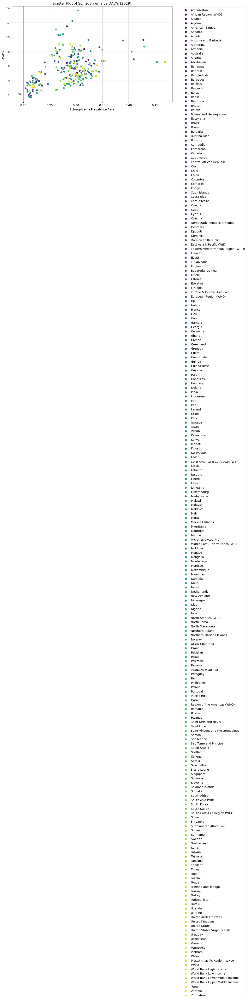

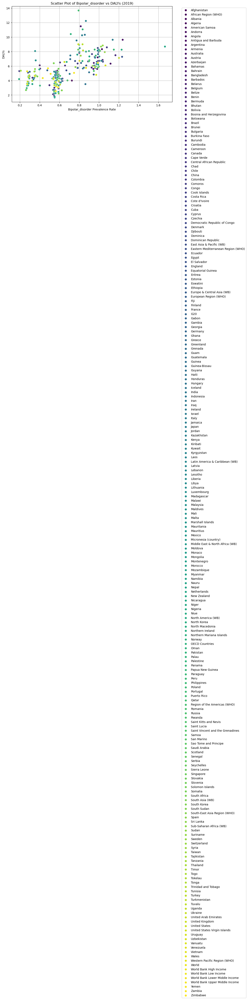

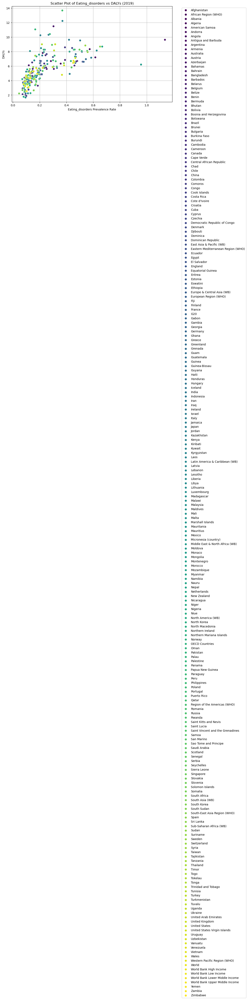

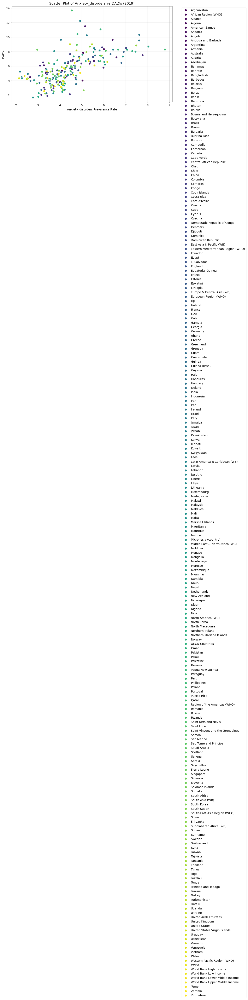

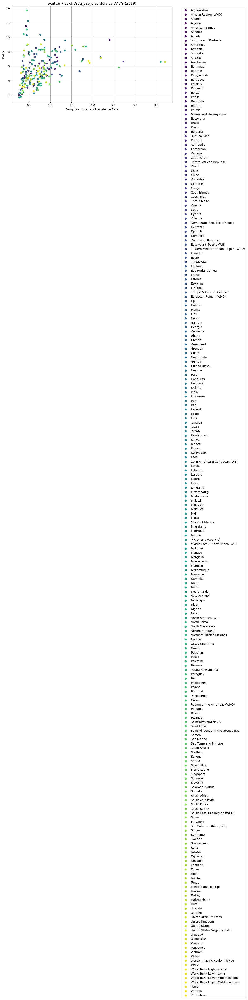

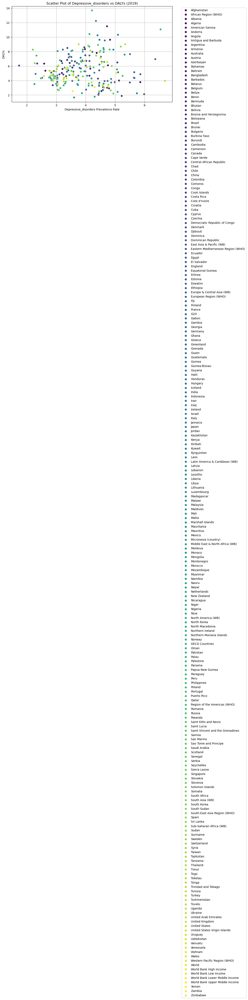

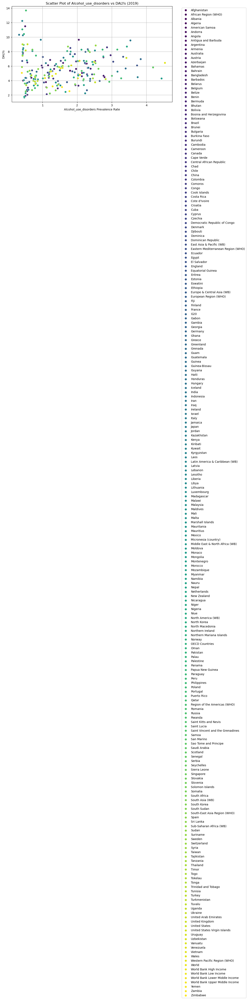

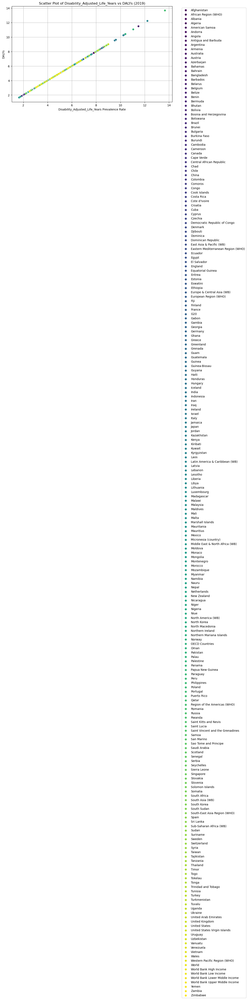

In [20]:
col = df.columns[2:]
for i in range(0, len(col)):
    x = last_year_data[col[i]]
    y = last_year_data['Disability_Adjusted_Life_Years']

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x = x, y = y, hue = last_year_data['Entity'], palette = 'viridis', s = 50)  
    plt.title(f'Scatter Plot of {col[i]} vs DALYs (2019)')
    plt.xlabel(f'{col[i]} Prevalence Rate')
    plt.ylabel('DALYs')
    plt.grid(True)

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

# Multiple Linear Regression

### Predict DALY using Entity and Disorders

In [138]:
X = df.drop(columns = ["Disability_Adjusted_Life_Years"])
y = df['Disability_Adjusted_Life_Years']

#one-hot encoding (converting Entity object type into numerical)
X = pd.get_dummies(X, columns=['Entity'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [139]:
s = model.score(X_train, y_train)
print(s)

0.9607644029374445


In [134]:
#Model performance of testing set
y_test_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)
print("Mean Squared Error for testing set:", mse)
print("R-squared for testing set:", r2)

Mean Squared Error for testing set: 0.23114712650969277
R-squared for testing set: 0.9545581945492221


In [23]:
#Model performance of training set
y_train_pred = model.predict(X_train)
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
print("Mean Squared Error for training set:", mse)
print("R-squared for training set:", r2)

Mean Squared Error for training set: 0.20812658534325432
R-squared for training set: 0.9607644029374445


In [32]:
data = pd.DataFrame({"Actual" : y_train, "Predicted" : y_train_pred})

<Axes: >

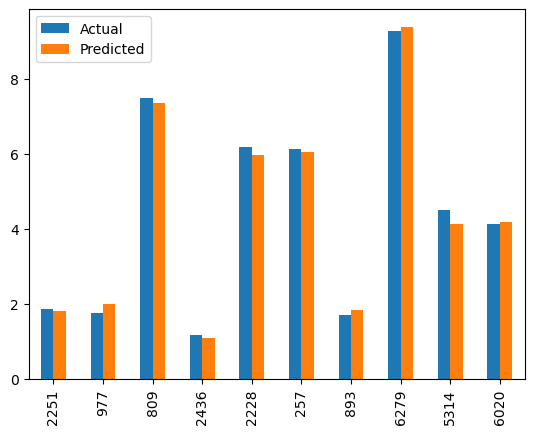

In [33]:
data.head(10).plot(kind = "bar")